In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import seaborn as sns

from pandas.tools.plotting import table

%matplotlib inline
plt.rcParams["figure.figsize"] = (15, 8)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
# import jtplot submodule from jupyterthemes
from jupyterthemes import jtplot
# currently installed theme will be used to
# set plot style if no arguments provided
jtplot.style()

In [3]:
from sklearn import datasets
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.tree import export_graphviz
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix

### Задание
Построение и настройка модели случайного леса. Визуализация важности признаков.
<br>
Цель: Выбрать любой датасет для задачи бинарной классификации

### Знакомство с данными

In [4]:
df = pd.read_csv('data/data.csv', index_col='id')
print('Размер выборки:', df.shape) #check size
df.head( )

Размер выборки: (569, 32)


,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
id,,,,,,,,,,,,,,,,,,,,,
842302,M,17.99,10.38,122.80,1001.00,0.12,0.28,0.30,0.15,0.24,...,17.33,184.60,2019.00,0.16,0.67,0.71,0.27,0.46,0.12,nan
842517,M,20.57,17.77,132.90,1326.00,0.08,0.08,0.09,0.07,0.18,...,23.41,158.80,1956.00,0.12,0.19,0.24,0.19,0.28,0.09,nan
84300903,M,19.69,21.25,130.00,1203.00,0.11,0.16,0.20,0.13,0.21,...,25.53,152.50,1709.00,0.14,0.42,0.45,0.24,0.36,0.09,nan
84348301,M,11.42,20.38,77.58,386.10,0.14,0.28,0.24,0.11,0.26,...,26.50,98.87,567.70,0.21,0.87,0.69,0.26,0.66,0.17,nan
84358402,M,20.29,14.34,135.10,1297.00,0.10,0.13,0.20,0.10,0.18,...,16.67,152.20,1575.00,0.14,0.20,0.40,0.16,0.24,0.08,nan


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 569 entries, 842302 to 92751
Data columns (total 32 columns):
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non-null float64
concave points_se        

In [6]:
#diagnosis is the only categorical feature
np.unique(df['diagnosis'])

array(['B', 'M'], dtype=object)

malignant - злокачественная
<br>
benign - доброкачественная

In [7]:
# finding nulls
df.isnull().sum()
#that's it - Unnamed: 32 

diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed: 32                569
dtype: i

In [8]:
df = df.drop(columns=['Unnamed: 32'])

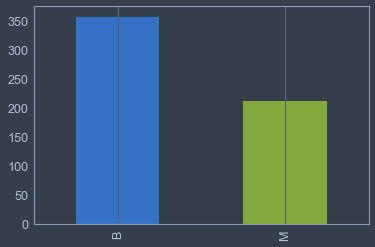

In [9]:
#Let's see the density 
df['diagnosis'].value_counts().plot.bar(figsize=(6, 4))
plt.grid(axis='y')

In [10]:
df['diagnosis'].value_counts(normalize=True)

B   0.63
M   0.37
Name: diagnosis, dtype: float64

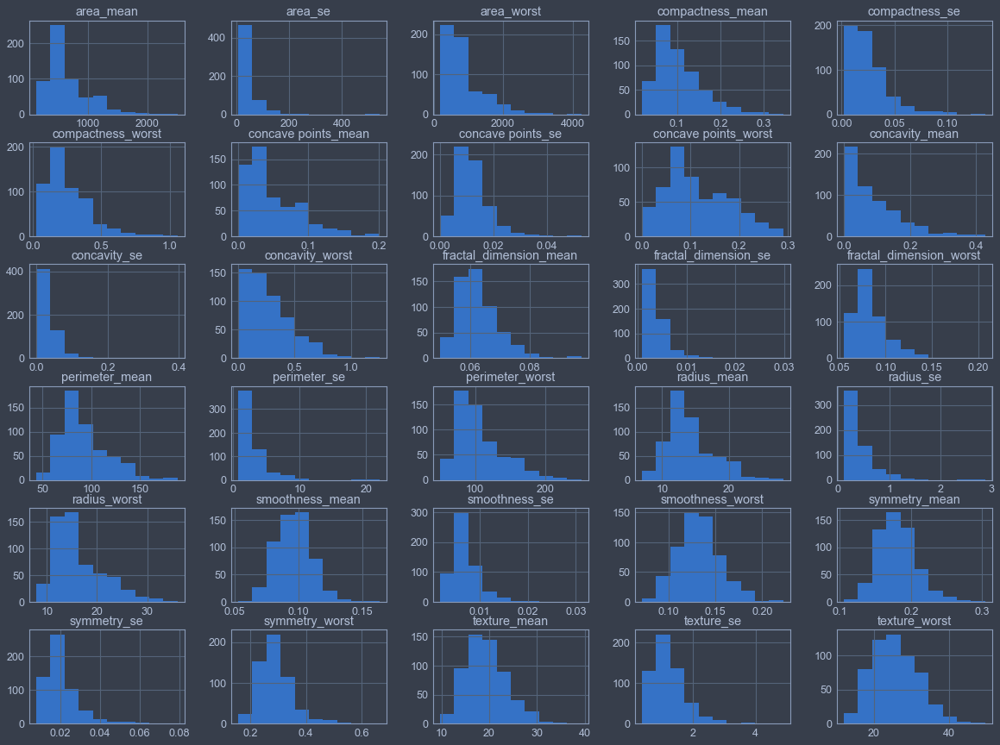

In [11]:
df.hist(figsize=(20, 15));

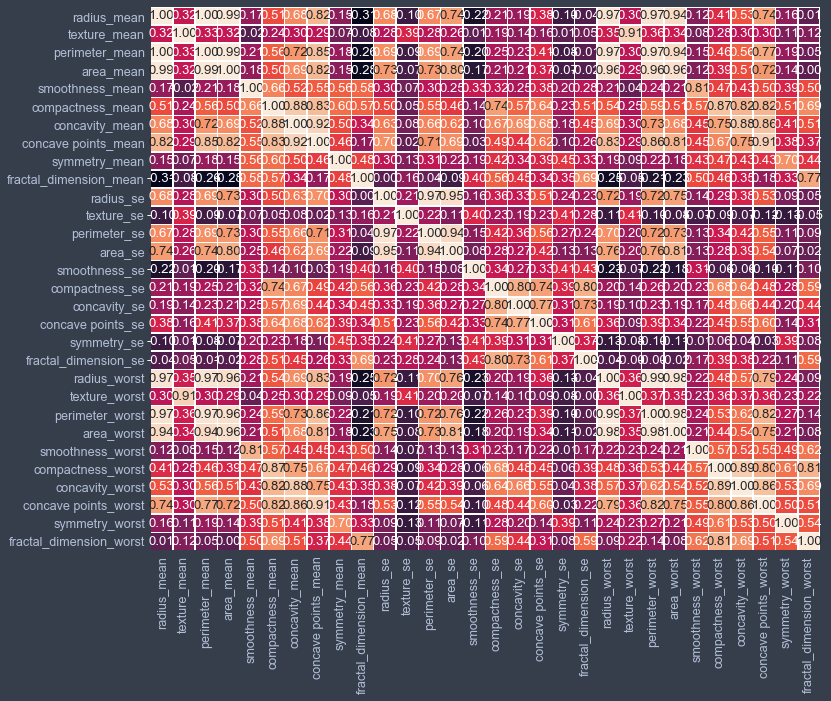

In [12]:
#correlation map
plt.figure(figsize=(12, 10))
sns.heatmap(df.corr(), annot=True, cbar=False, linewidths=.5, fmt= '.2f')
plt.show()

/Users/alexandrbagdasarov/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


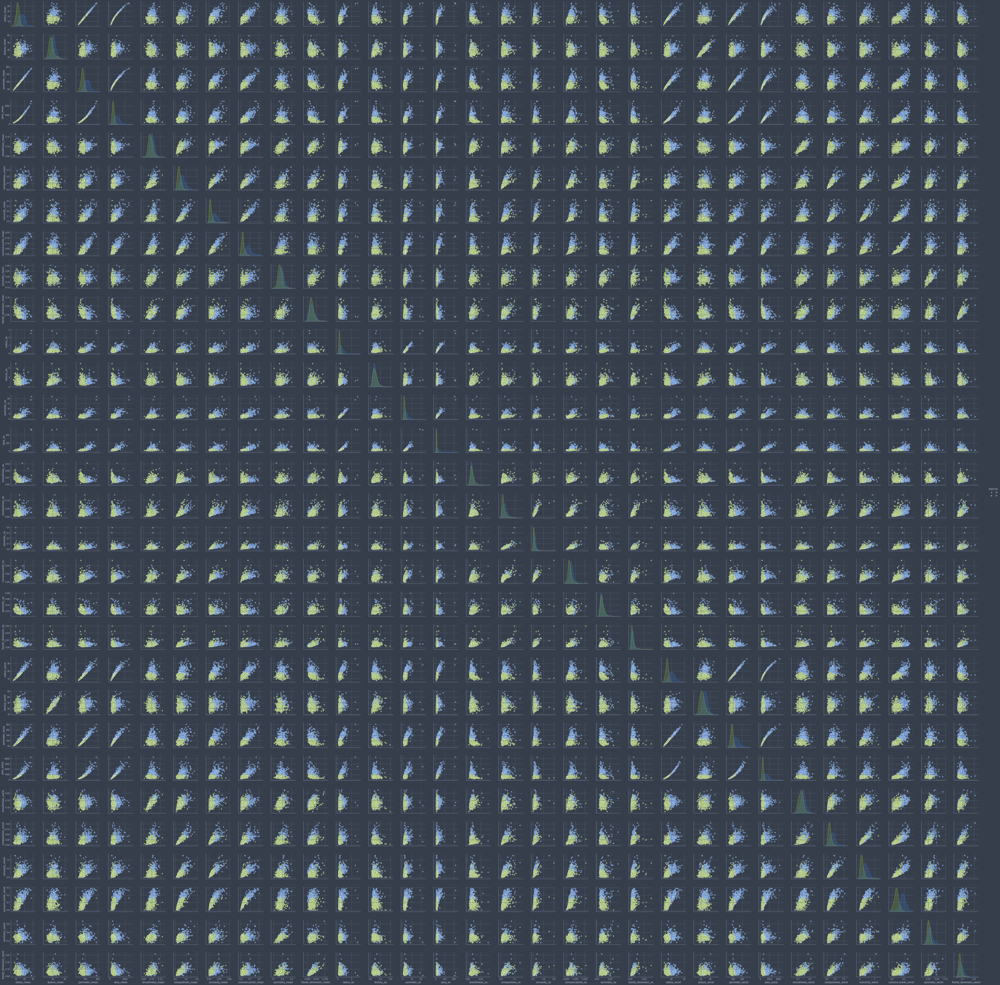

In [13]:
sns.pairplot(df, hue='diagnosis');

### Избавление от линейно-зависимых признаков 

In [14]:
#ok, let's start thinking about droping features
correlations = df.corr()
used_corr_index = []
interesting_corr_index = []
for i in correlations:
    for j in correlations.index[correlations[i].abs() > 0.85]:
        # if i != j and i not in used_corr_index and j not in used_corr_index:
        if i != j and [i,j] not in used_corr_index and [j,i] not in used_corr_index:
        #if i != j and [i,j] not in used_corr_index:
            used_corr_index.append([i,j])
            print(correlations[i][correlations.index == j].values[0], "  ", i, "  ", j )
            interesting_corr_index.append([i,j,correlations[i][correlations.index == j].values[0]])

0.9978552814938113    radius_mean    perimeter_mean
0.9873571700566119    radius_mean    area_mean
0.9695389726112053    radius_mean    radius_worst
0.9651365139559878    radius_mean    perimeter_worst
0.9410824595860459    radius_mean    area_worst
0.9120445888404215    texture_mean    texture_worst
0.9865068039913906    perimeter_mean    area_mean
0.8509770412528199    perimeter_mean    concave points_mean
0.9694763634663142    perimeter_mean    radius_worst
0.9703868870426388    perimeter_mean    perimeter_worst
0.9415498080023057    perimeter_mean    area_worst
0.9627460860470841    area_mean    radius_worst
0.959119574355266    area_mean    perimeter_worst
0.9592133256499006    area_mean    area_worst
0.8831206701772499    compactness_mean    concavity_mean
0.8658090398022638    compactness_mean    compactness_worst
0.9213910263788594    concavity_mean    concave points_mean
0.8841026390943831    concavity_mean    concavity_worst
0.8613230336379504    concavity_mean    concave poi

In [15]:
mean = ['diagnosis','radius_mean', 'perimeter_mean', 'area_mean', 'compactness_mean', 'concavity_mean', 
        'concave points_mean', 'symmetry_mean', 'smoothness_mean', 'fractal_dimension_mean','texture_mean']
worst = ['diagnosis','radius_worst', 'perimeter_worst', 'area_worst', 'compactness_worst', 'concavity_worst',
        'concave points_worst', 'symmetry_worst', 'smoothness_worst', 'fractal_dimension_worst', 'texture_worst']
se = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se',
     'concave points_se', 'symmetry_se', 'fractal_dimension_se']

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a36267eb8>,
      dtype=object)

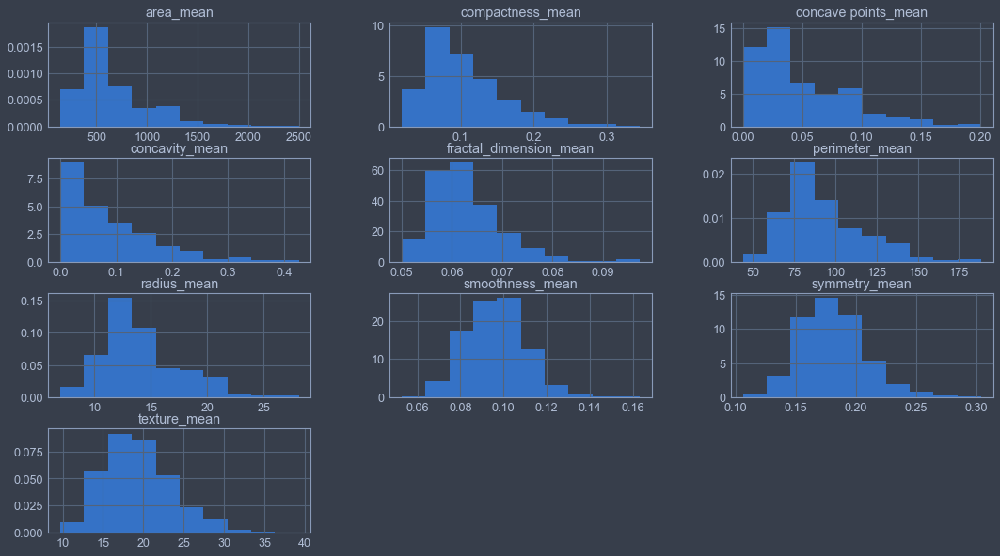

In [16]:
df[mean].hist(figsize=(18,10), density=True)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a3f52dc50>,
      dtype=object)

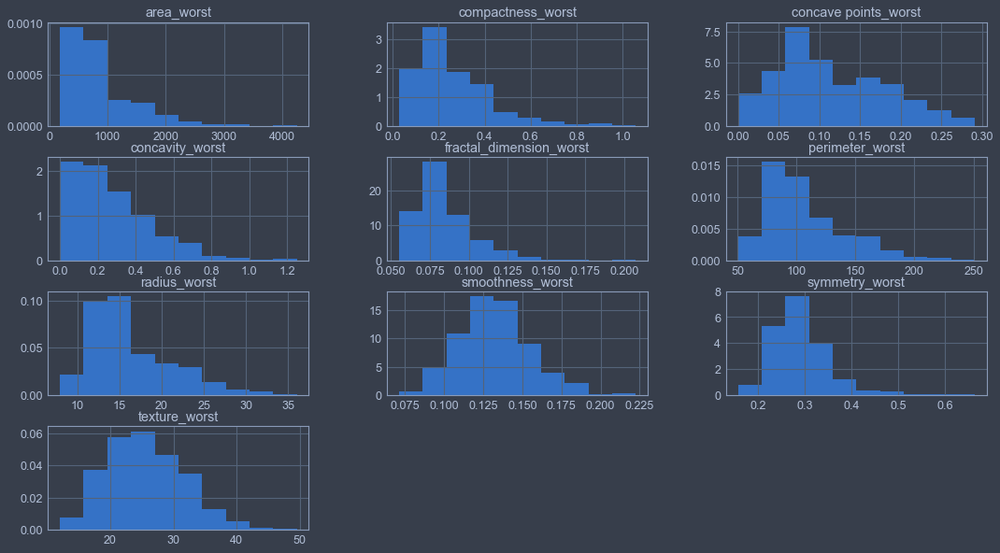

In [17]:
df[worst].hist(figsize=(18,10), density=True)

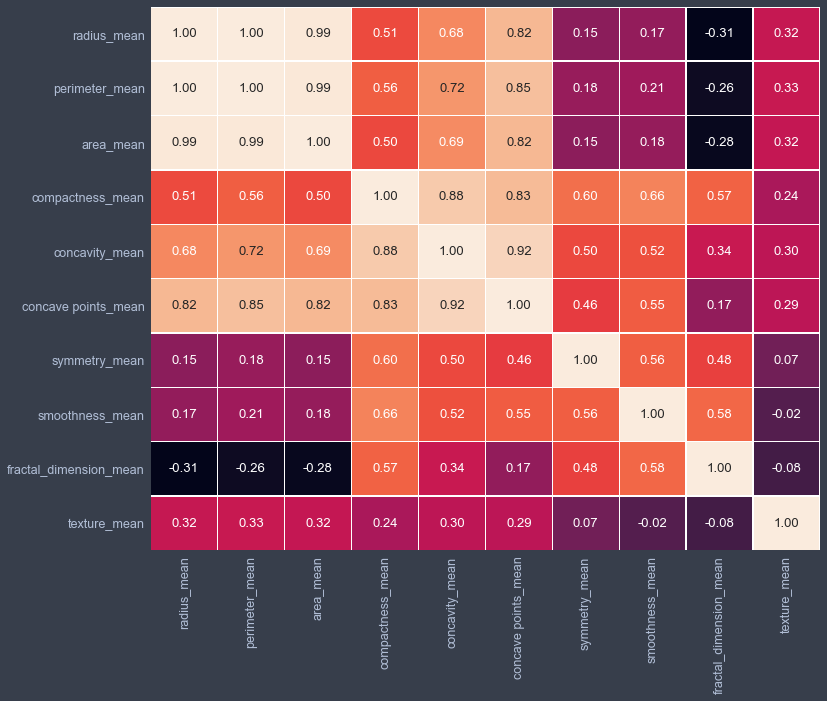

In [18]:
#correlation map of mean features
plt.figure(figsize=(12, 10))
sns.heatmap(df[mean].corr(), annot=True, cbar=False, linewidths=.5, fmt= '.2f')
plt.show()

In [19]:
correlations = df[mean].corr()
used_corr_index = []
interesting_corr_index=[]
for i in correlations:
    for j in correlations.index[correlations[i].abs() > 0.85]:
        # if i != j and i not in used_corr_index and j not in used_corr_index:
        if i != j and [i,j] not in used_corr_index and [j,i] not in used_corr_index:
        #if i != j and [i,j] not in used_corr_index:
            used_corr_index.append([i,j])
            print(correlations[i][correlations.index == j].values[0], "  ", i, "  ", j )
            interesting_corr_index.append([i,j,correlations[i][correlations.index == j].values[0]])

0.9978552814938113    radius_mean    perimeter_mean
0.9873571700566119    radius_mean    area_mean
0.9865068039913906    perimeter_mean    area_mean
0.8509770412528199    perimeter_mean    concave points_mean
0.8831206701772499    compactness_mean    concavity_mean
0.9213910263788594    concavity_mean    concave points_mean


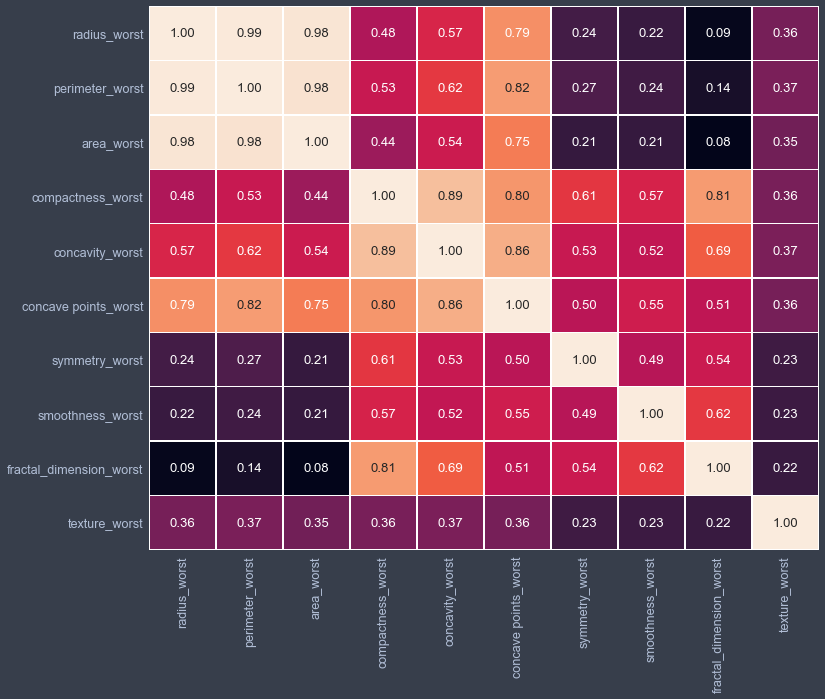

In [20]:
#correlation map of worst features
plt.figure(figsize=(12, 10))
sns.heatmap(df[worst].corr(), annot=True, cbar=False, linewidths=.5, fmt= '.2f')
plt.show()

In [21]:
correlations = df[worst].corr()
used_corr_index = []
interesting_corr_index=[]
for i in correlations:
    for j in correlations.index[correlations[i].abs() > 0.85]:
        # if i != j and i not in used_corr_index and j not in used_corr_index:
        if i != j and [i,j] not in used_corr_index and [j,i] not in used_corr_index:
        #if i != j and [i,j] not in used_corr_index:
            used_corr_index.append([i,j])
            print(correlations[i][correlations.index == j].values[0], "  ", i, "  ", j )
            interesting_corr_index.append([i,j,correlations[i][correlations.index == j].values[0]])

0.993707916102951    radius_worst    perimeter_worst
0.9840145644590724    radius_worst    area_worst
0.9775780914063881    perimeter_worst    area_worst
0.8922608987764692    compactness_worst    concavity_worst
0.8554338603439984    concavity_worst    concave points_worst


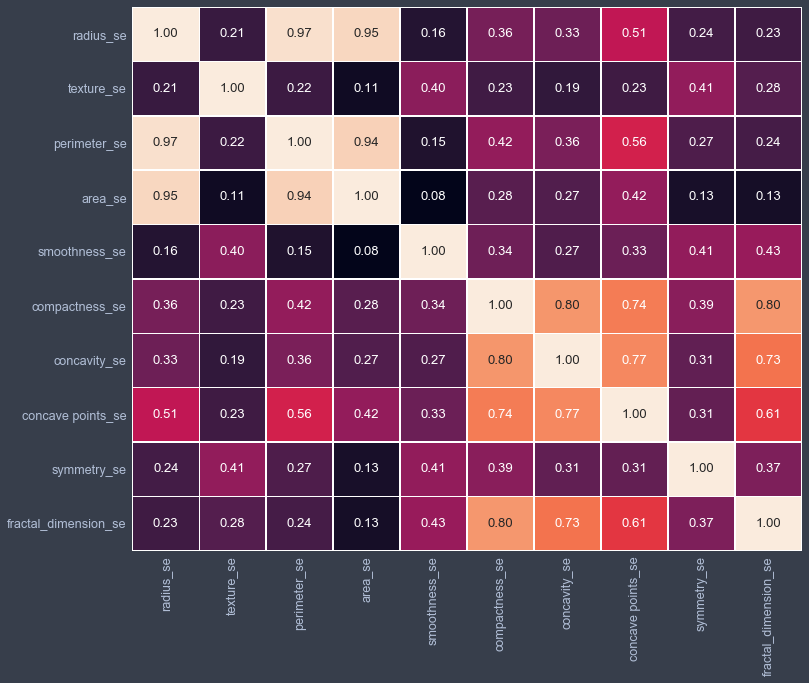

In [22]:
#correlation map of se features
plt.figure(figsize=(12, 10))
sns.heatmap(df[se].corr(), annot=True, cbar=False, linewidths=.5, fmt= '.2f')
plt.show()

In [23]:
correlations = df[se].corr()
used_corr_index = []
interesting_corr_index=[]
for i in correlations:
    for j in correlations.index[correlations[i].abs() > 0.85]:
        # if i != j and i not in used_corr_index and j not in used_corr_index:
        if i != j and [i,j] not in used_corr_index and [j,i] not in used_corr_index:
        #if i != j and [i,j] not in used_corr_index:
            used_corr_index.append([i,j])
            print(correlations[i][correlations.index == j].values[0], "  ", i, "  ", j )
            interesting_corr_index.append([i,j,correlations[i][correlations.index == j].values[0]])

0.9727936770160752    radius_se    perimeter_se
0.95183011211099    radius_se    area_se
0.9376554069544158    perimeter_se    area_se


In [24]:
drop_list = ['perimeter_mean','radius_mean','compactness_mean',
             'concave points_mean','radius_se','perimeter_se',
             'radius_worst','perimeter_worst','compactness_worst',
             'concave points_worst','compactness_se','concave points_se',
             'texture_worst','area_worst','concavity_se','concavity_worst']

df_drop = df.drop(drop_list, axis = 1)
df_drop.head()

,diagnosis,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,symmetry_se,fractal_dimension_se,smoothness_worst,symmetry_worst,fractal_dimension_worst
id,,,,,,,,,,,,,,,
842302,M,10.38,1001.00,0.12,0.30,0.24,0.08,0.91,153.40,0.01,0.03,0.01,0.16,0.46,0.12
842517,M,17.77,1326.00,0.08,0.09,0.18,0.06,0.73,74.08,0.01,0.01,0.00,0.12,0.28,0.09
84300903,M,21.25,1203.00,0.11,0.20,0.21,0.06,0.79,94.03,0.01,0.02,0.00,0.14,0.36,0.09
84348301,M,20.38,386.10,0.14,0.24,0.26,0.10,1.16,27.23,0.01,0.06,0.01,0.21,0.66,0.17
84358402,M,14.34,1297.00,0.10,0.20,0.18,0.06,0.78,94.44,0.01,0.02,0.01,0.14,0.24,0.08


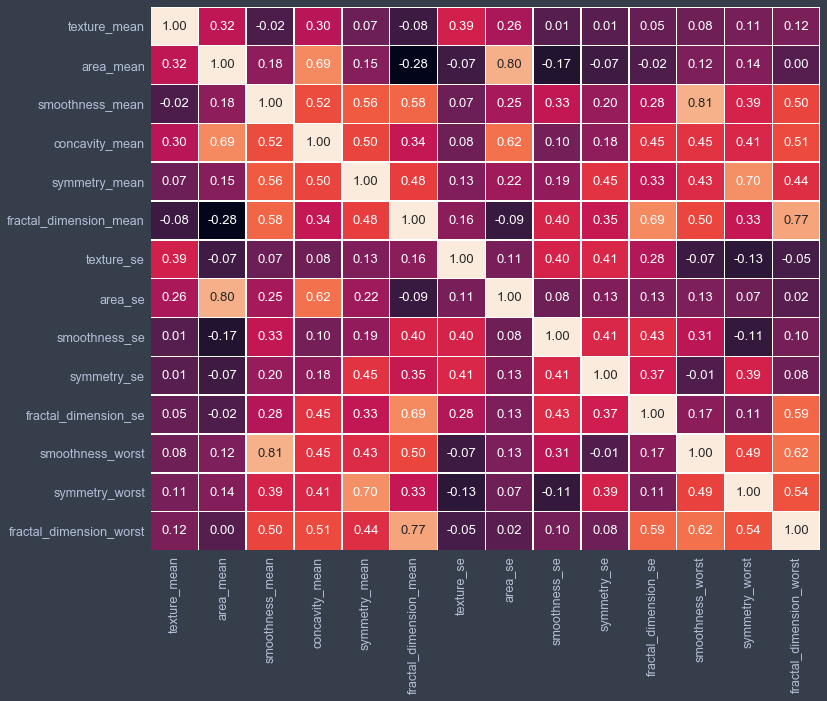

In [25]:
#correlation map of df_drop features
plt.figure(figsize=(12, 10))
sns.heatmap(df_drop.corr(), annot=True, cbar=False, linewidths=.5, fmt= '.2f')
plt.show()

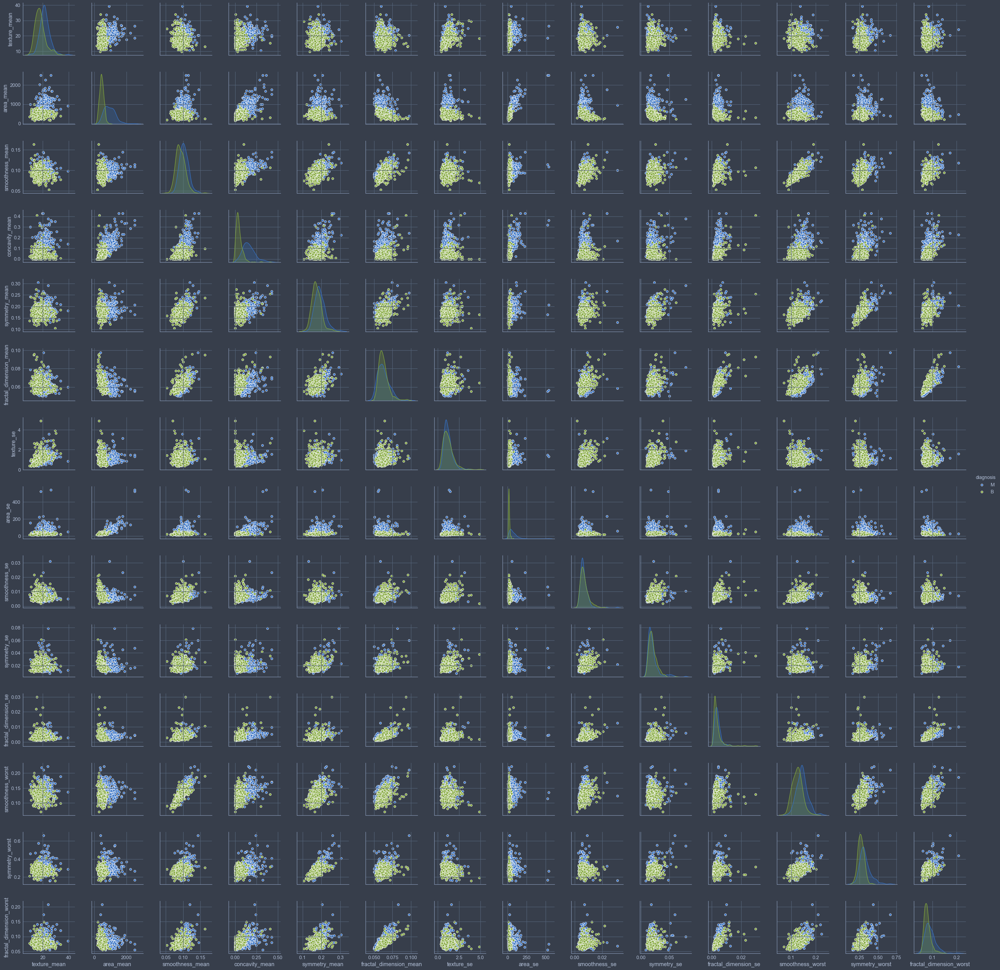

In [26]:
sns.pairplot(df_drop, hue='diagnosis');

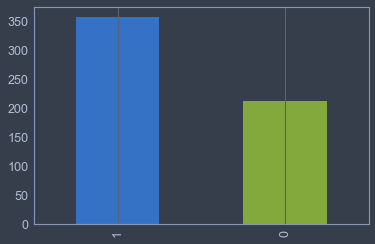

In [27]:
#Ok, I think it's time to decode diagnosis
#malignant - 0
#benign - 1
df_drop['diagnosis'] = df_drop['diagnosis'].apply(lambda x: 1 if x=='B' else 0)

#Let's see the density just to check
df_drop['diagnosis'].value_counts().plot.bar(figsize=(6, 4))
plt.grid(axis='y')

### Построение модели.
#### Random Forest

In [52]:
from sklearn.ensemble import RandomForestClassifier

#train-test split
X_train, X_test, y_train, y_test = train_test_split(
    df_drop.drop(['diagnosis'], axis=1), df_drop['diagnosis'], test_size=0.30, random_state=42, stratify=df_drop["diagnosis"])

#standardization 
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [53]:
def print_metrics(prediction, actual):
    print("Test Accuracy",accuracy_score(prediction, actual))
    print("Test Precision",precision_score(prediction, actual))
    print("Test Recall",recall_score(prediction, actual))
    print("Test f1_score",f1_score(prediction, actual))
    pass
    
def quality_report(prediction, actual):
    stats = [
        accuracy_score(prediction, actual),
        precision_score(prediction, actual),
        recall_score(prediction, actual),
        f1_score(prediction, actual)
    ]
    return stats

metrics_output = pd.DataFrame({"metrics":[
                                  "Test Accuracy", "Test Precision", "Test Recall", "Test f1_score"]})
metrics_output.set_index("metrics")

""
metrics
Test Accuracy
Test Precision
Test Recall
Test f1_score


In [54]:
def plot_roc_curve(prob_prediction, actual):
    fpr, tpr, thresholds = roc_curve(y_test, prob_prediction)
    auc_score = roc_auc_score(y_test, prob_prediction)
    
    plt.plot(fpr, tpr, label='ROC curve ')
    plt.plot([0, 1], [0, 1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC AUC: {:.3f}'.format(auc_score))
    plt.show()

In [55]:
#random forest classifier with n_estimators=10 (default)
rf = RandomForestClassifier(n_estimators=1000, random_state = 43, class_weight='balanced')
rf = rf.fit(X_train_scaled, y_train)

metrics_output["rf"] = quality_report(rf.predict(X_test_scaled), y_test)
metrics_output

,metrics,rf
0,Test Accuracy,0.95
1,Test Precision,0.97
2,Test Recall,0.95
3,Test f1_score,0.96


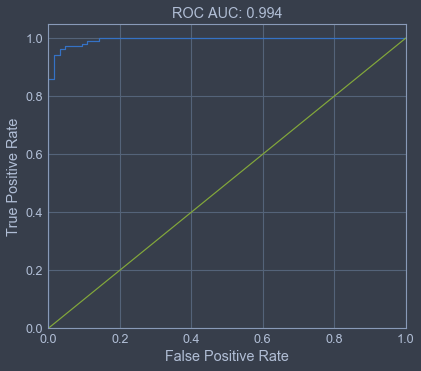

In [56]:
plot_roc_curve(rf.predict_proba(X_test_scaled)[:,1], y_test)

так, пока что-то показатель ROC AUC ниже, чем при логистической регрессии и knn

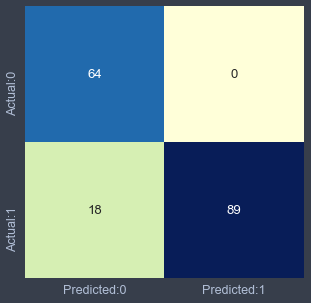

In [45]:
cm = confusion_matrix(y_test, rf.predict_proba(X_test_scaled)[:, 1]>0.8)

conf_matrix = pd.DataFrame(data = cm, columns = ['Predicted:0','Predicted:1'], index=['Actual:0','Actual:1'])
plt.figure(figsize = (5,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu", cbar=False);

In [46]:
import sklearn
from graphviz import Source

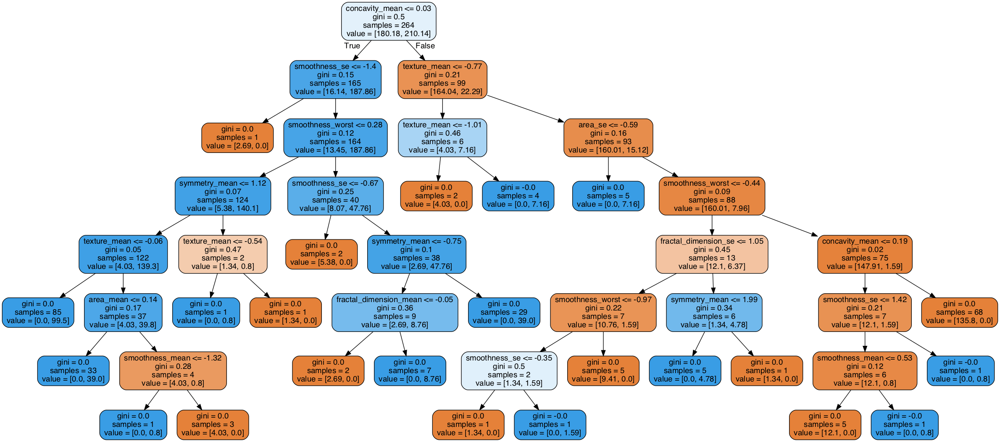

In [48]:
#Single tree
estimator = rf.estimators_[7]

graph = Source(sklearn.tree.export_graphviz(estimator, out_file=None, feature_names=X_train.columns,
                                           rounded = True, proportion = False, 
                precision = 2, filled = True))
png_bytes = graph.pipe(format='png')
with open('dtree_pipe.png','wb') as f:
    f.write(png_bytes)

from IPython.display import Image
Image(png_bytes)

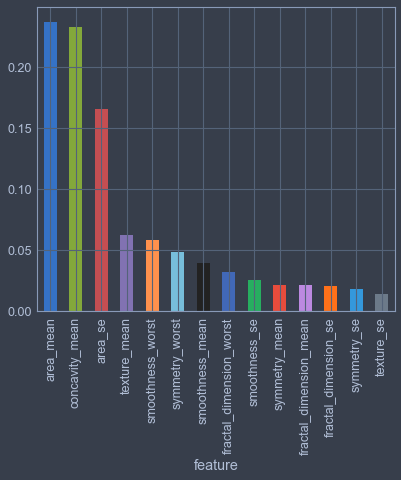

In [51]:
featureImportance = pd.DataFrame({"feature": X_train.columns, 
                                  "importance": rf.feature_importances_})

featureImportance.set_index('feature', inplace=True)
featureImportance.sort_values(["importance"], ascending=False, inplace=True)
featureImportance["importance"].plot('bar');